In [1]:
import torch
import os
from IPython.display import Image, clear_output
!git clone https://github.com/sunsmarterjie/yolov12
%cd yolov12
!pip install roboflow supervision flash-attn --upgrade -q
!pip install -r requirements.txt
!pip install -e .
!pip install --upgrade flash-attn
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

fatal: destination path 'yolov12' already exists and is not an empty directory.
/content/yolov12
Processing ./flash_attn-2.7.3+cu11torch2.2cxx11abiFALSE-cp311-cp311-linux_x86_64.whl (from -r requirements.txt (line 3))
ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: '/content/yolov12/flash_attn-2.7.3+cu11torch2.2cxx11abiFALSE-cp311-cp311-linux_x86_64.whl'

Obtaining file:///content/yolov12
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.3.63-0.editable-py3-none-any.whl size=18824 sha256=3f78093e6bfcbbb97577db006a152447a32b695a7327a36ddc6cacfa68a05a7c
  Stored in directory: /tmp/pip-ephem-wheel-cache-l26mdx9e/wheels/2f/97/19/dd82feac2203038bb82fbbfe2498f6943d715525dc3872e3e

In [3]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/wassim"
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="GkkTDfjpQrqeH5e5VqVK")
project = rf.workspace("project-uyrxf").project("ppe_detection-v1x3l")
version = project.version(2)
dataset = version.download("yolov12")

loading Roboflow workspace...
loading Roboflow project...


In [4]:
from ultralytics import YOLO

model = YOLO('yolov12n.pt')

results = model.train(
  data="/content/wassim/PPE_Detection-2/data.yaml",
  epochs=40
)

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.


Importing from timm.models.layers is deprecated, please import via timm.layers


New https://pypi.org/project/ultralytics/8.3.78 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov12n.pt, data=/content/wassim/PPE_Detection-2/data.yaml, epochs=40, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=Fa

train: Scanning /content/wassim/PPE_Detection-2/train/labels... 2271 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2271/2271 [00:01<00:00, 2024.28it/s]

train: New cache created: /content/wassim/PPE_Detection-2/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression
val: Scanning /content/wassim/PPE_Detection-2/valid/labels... 637 images, 0 backgrounds, 0 corrupt: 100%|██████████| 637/637 [00:00<00:00, 1495.38it/s]


val: New cache created: /content/wassim/PPE_Detection-2/valid/labels.cache
Plotting labels to /content/yolov12/runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 127 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/yolov12/runs/detect/train2
Starting training for 40 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/142 [00:00<?, ?it/s]Memory Efficient attention defaults to a non-deterministic algorithm. To explicitly enable determinism call torch.use_deterministic_algorithms(True, warn_only=False). (Triggered internally at ../aten/src/ATen/native/transformers/cuda/attention_backward.cu:655.)
       1/40      3.04G      1.507      2.859      1.388         98        640: 100%|██████████| 142/142 [00:49<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.54it/s]

                   all        637       3064      0.796      0.459      0.513        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/40      2.97G      1.435      1.666      1.322         77        640: 100%|██████████| 142/142 [00:46<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.25it/s]

                   all        637       3064      0.766      0.563      0.611      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/40      2.98G      1.418      1.523      1.337        144        640: 100%|██████████| 142/142 [00:45<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.97it/s]


                   all        637       3064      0.649      0.601      0.632      0.375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/40      3.08G      1.389      1.388      1.308        111        640: 100%|██████████| 142/142 [00:44<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.97it/s]

                   all        637       3064      0.749      0.642      0.677      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/40      2.93G      1.338      1.252      1.284        116        640: 100%|██████████| 142/142 [00:44<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.04it/s]

                   all        637       3064       0.72      0.682        0.7      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/40      2.93G      1.311      1.185      1.271         97        640: 100%|██████████| 142/142 [00:44<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.05it/s]

                   all        637       3064      0.735      0.693      0.719      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/40      2.98G      1.294      1.114       1.26        111        640: 100%|██████████| 142/142 [00:44<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.05it/s]

                   all        637       3064      0.801      0.723      0.763      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/40      2.98G      1.271      1.058      1.245         87        640: 100%|██████████| 142/142 [00:45<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.20it/s]

                   all        637       3064      0.754      0.691       0.74      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/40      2.95G      1.261      1.027      1.239        127        640: 100%|██████████| 142/142 [00:45<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.53it/s]

                   all        637       3064      0.798      0.748      0.786      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/40      2.92G      1.235      1.001      1.232         81        640: 100%|██████████| 142/142 [00:45<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.54it/s]

                   all        637       3064      0.808      0.742      0.782      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/40      2.99G      1.213     0.9411      1.218        133        640: 100%|██████████| 142/142 [00:45<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.63it/s]

                   all        637       3064      0.805      0.756      0.786      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/40      3.16G      1.208     0.9334      1.207         96        640: 100%|██████████| 142/142 [00:45<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.55it/s]

                   all        637       3064      0.876      0.713       0.79      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/40       3.1G      1.199     0.8972      1.204        103        640: 100%|██████████| 142/142 [00:45<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.59it/s]

                   all        637       3064       0.82      0.777      0.829      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/40      2.98G      1.184     0.8767      1.194         75        640: 100%|██████████| 142/142 [00:45<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.52it/s]

                   all        637       3064      0.837      0.775      0.821      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/40      2.93G      1.182      0.867      1.195         79        640: 100%|██████████| 142/142 [00:45<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.41it/s]

                   all        637       3064      0.835      0.773      0.834      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/40      2.92G      1.167     0.8314      1.184         90        640: 100%|██████████| 142/142 [00:44<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.27it/s]

                   all        637       3064      0.879      0.771      0.835      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/40      3.01G      1.141     0.8167      1.169        139        640: 100%|██████████| 142/142 [00:44<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.15it/s]

                   all        637       3064      0.846      0.766      0.816      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/40      2.94G      1.148     0.8044      1.173        109        640: 100%|██████████| 142/142 [00:44<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.11it/s]

                   all        637       3064      0.861      0.788      0.845      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/40      3.11G      1.126     0.7846      1.167         83        640: 100%|██████████| 142/142 [00:44<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.09it/s]

                   all        637       3064      0.873      0.784      0.841      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/40      2.96G       1.12     0.7688       1.16         85        640: 100%|██████████| 142/142 [00:44<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.12it/s]

                   all        637       3064      0.896      0.771      0.845      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/40      2.93G      1.105     0.7581      1.156        126        640: 100%|██████████| 142/142 [00:44<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.02it/s]

                   all        637       3064       0.87      0.797      0.847      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/40      2.97G      1.101     0.7347      1.141         79        640: 100%|██████████| 142/142 [00:44<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.10it/s]

                   all        637       3064      0.855      0.781       0.85      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/40      2.95G      1.092     0.7262      1.136         66        640: 100%|██████████| 142/142 [00:44<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.19it/s]

                   all        637       3064      0.887      0.795      0.858      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/40      2.97G      1.091     0.7234      1.147         83        640: 100%|██████████| 142/142 [00:44<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.22it/s]

                   all        637       3064       0.85      0.822      0.864      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/40      2.94G       1.07     0.6932      1.121         89        640: 100%|██████████| 142/142 [00:44<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]

                   all        637       3064      0.851      0.821      0.858      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/40      2.93G      1.059     0.6872       1.12         90        640: 100%|██████████| 142/142 [00:45<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.53it/s]

                   all        637       3064       0.89       0.79      0.856      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/40      3.13G      1.059     0.6742      1.119         91        640: 100%|██████████| 142/142 [00:45<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.55it/s]

                   all        637       3064      0.887       0.81      0.872      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/40      2.97G      1.043      0.666      1.114         60        640: 100%|██████████| 142/142 [00:45<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.59it/s]

                   all        637       3064      0.914      0.799      0.871      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/40      2.94G      1.031     0.6662      1.116         95        640: 100%|██████████| 142/142 [00:45<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.60it/s]

                   all        637       3064      0.871      0.826      0.877      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/40      2.93G      1.029     0.6547      1.109        103        640: 100%|██████████| 142/142 [00:45<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.57it/s]

                   all        637       3064      0.873      0.835      0.887      0.605


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/40      2.96G          1     0.5864      1.089         72        640: 100%|██████████| 142/142 [00:45<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.48it/s]

                   all        637       3064      0.876      0.841      0.885       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/40      2.97G     0.9952     0.5679      1.085         43        640: 100%|██████████| 142/142 [00:43<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.54it/s]

                   all        637       3064      0.868      0.839      0.876      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/40      2.99G     0.9791     0.5536      1.075         56        640: 100%|██████████| 142/142 [00:43<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.58it/s]

                   all        637       3064      0.885      0.838      0.894      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/40       2.9G     0.9633      0.543      1.063         51        640: 100%|██████████| 142/142 [00:43<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.60it/s]

                   all        637       3064      0.901      0.817      0.884      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/40      2.88G     0.9466     0.5319      1.061         60        640: 100%|██████████| 142/142 [00:43<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.59it/s]

                   all        637       3064      0.867      0.841      0.879      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/40       2.9G     0.9375      0.518      1.056         47        640: 100%|██████████| 142/142 [00:43<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.53it/s]

                   all        637       3064      0.886      0.846      0.898      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/40      2.89G     0.9261     0.5053      1.048         62        640: 100%|██████████| 142/142 [00:44<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.28it/s]

                   all        637       3064      0.933      0.823      0.899      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/40      2.88G       0.92     0.5034      1.046         57        640: 100%|██████████| 142/142 [00:43<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.41it/s]

                   all        637       3064      0.936      0.836      0.911      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/40      2.98G     0.9075     0.4956      1.041         78        640: 100%|██████████| 142/142 [00:43<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.17it/s]

                   all        637       3064      0.941      0.833       0.91      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/40      2.89G     0.8966     0.4884      1.032         48        640: 100%|██████████| 142/142 [00:42<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:07<00:00,  2.83it/s]

                   all        637       3064      0.897      0.863      0.915      0.632



40 epochs completed in 0.579 hours.
Optimizer stripped from /content/yolov12/runs/detect/train2/weights/last.pt, 5.5MB
Optimizer stripped from /content/yolov12/runs/detect/train2/weights/best.pt, 5.5MB

Validating /content/yolov12/runs/detect/train2/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 352 layers, 2,558,093 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.17it/s]


                   all        637       3064      0.888      0.875      0.915      0.632
             Dust Mask        299        308      0.972      0.918      0.954      0.677
              Eye Wear        146        147      0.744      0.772      0.835      0.479
                 Glove        346        631      0.952      0.889      0.937      0.667
      Protective Boots        298        608      0.937      0.961      0.981        0.7
     Protective Helmet        403        753      0.951      0.964      0.984      0.753
           Safety Vest        359        592       0.84      0.894      0.922      0.705
                Shield         25         25      0.819      0.726      0.793       0.44
Speed: 0.3ms preprocess, 3.8ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /content/yolov12/runs/detect/train2


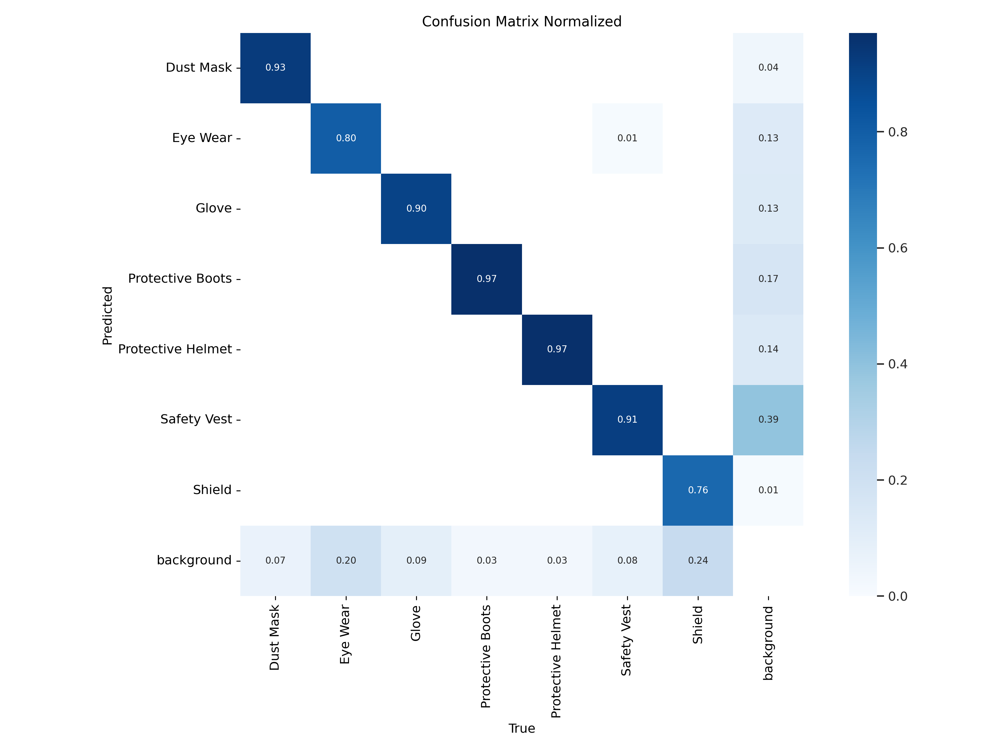

In [6]:
Image("/content/yolov12//runs/detect/train2/confusion_matrix_normalized.png", width=600)

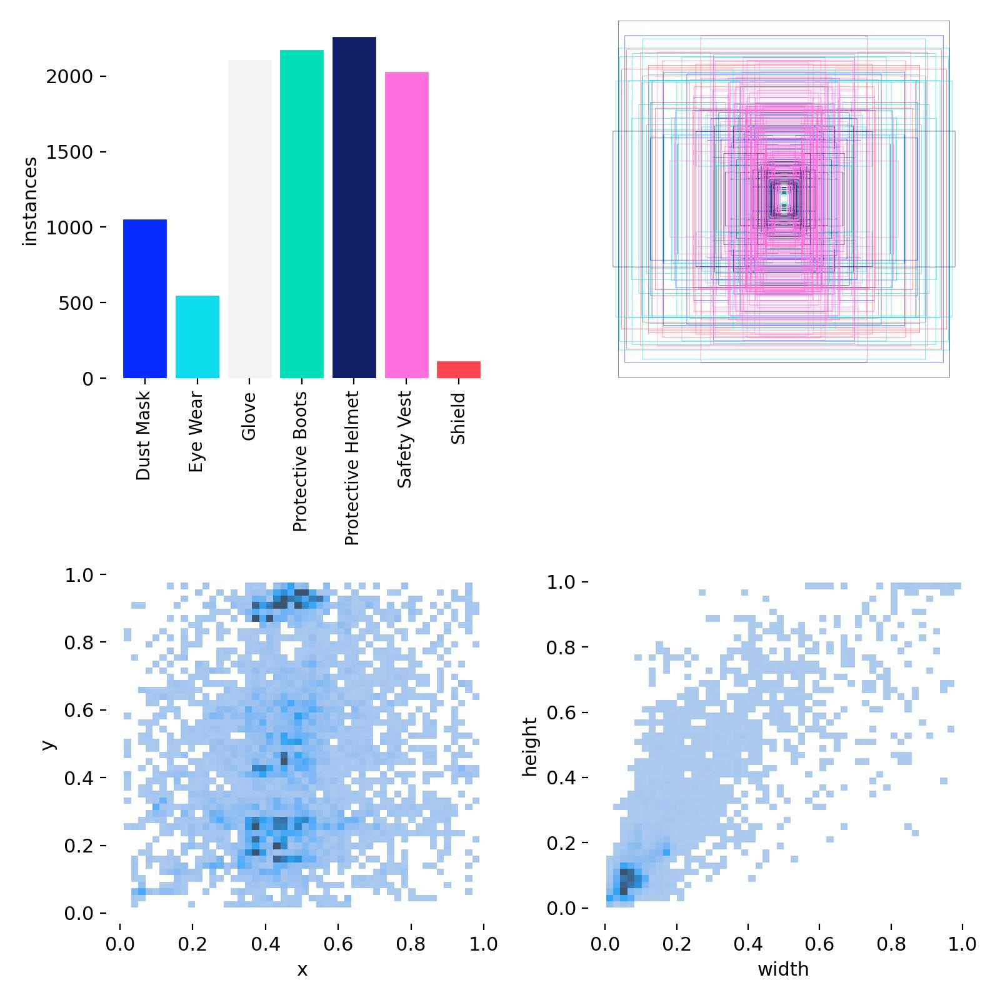

In [7]:
Image("/content/yolov12/runs/detect/train2/labels.jpg", width=600)

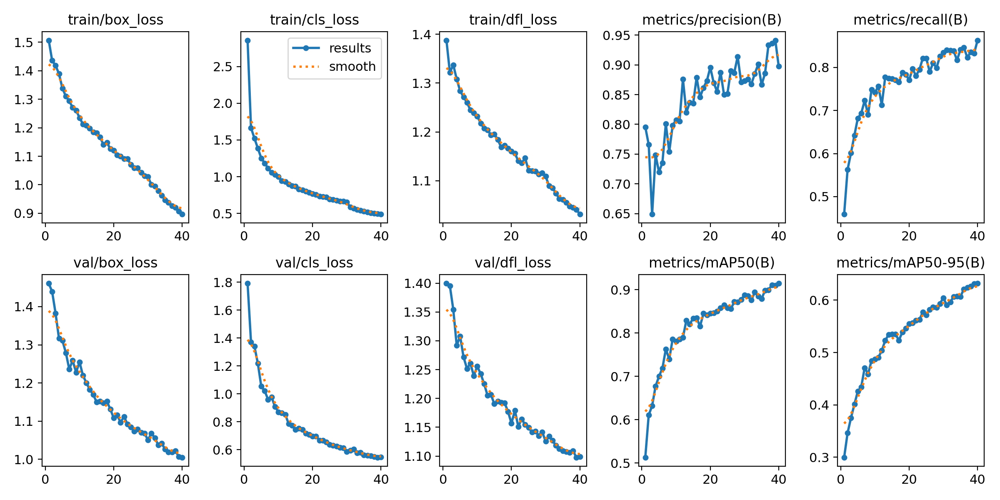

In [8]:
Image("/content/yolov12/runs/detect/train2/results.png", width=600)

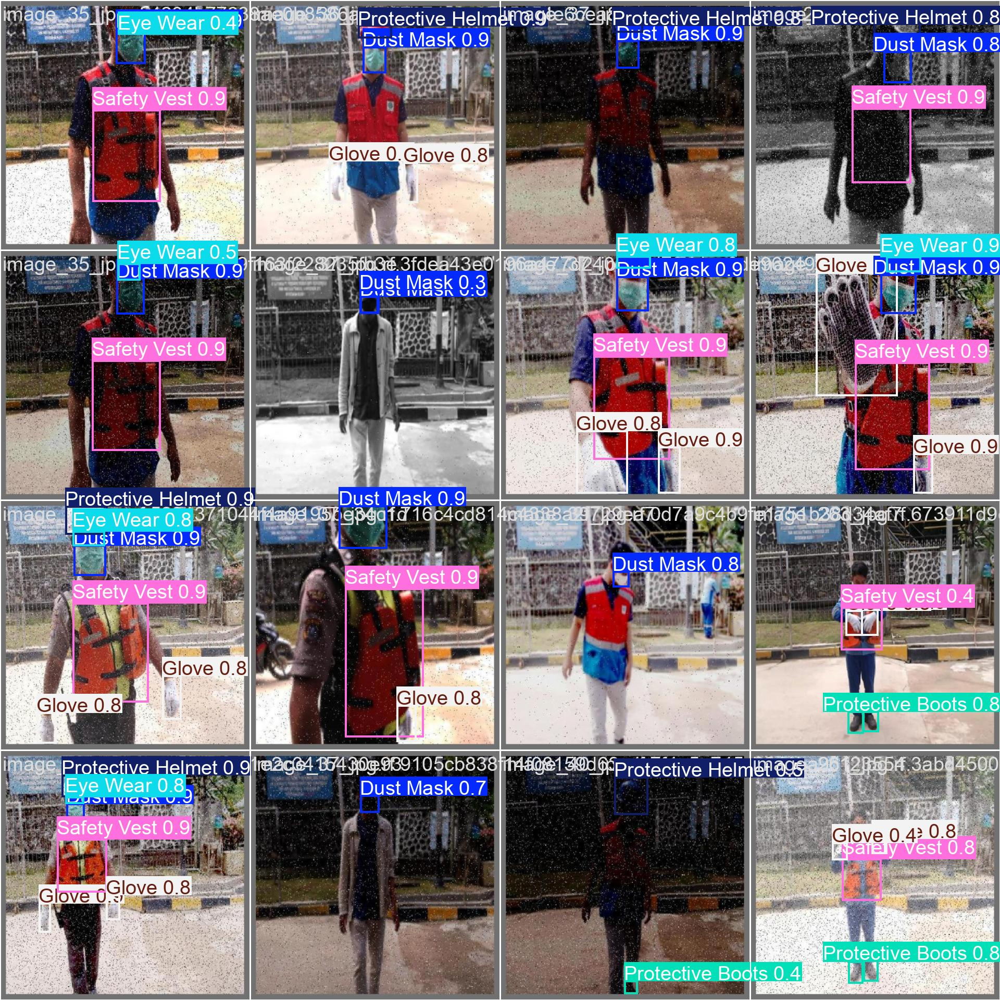

In [9]:
Image("/content/yolov12/runs/detect/train2/val_batch2_pred.jpg", width=600)

In [11]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [12]:
!yolo task=detect mode=val model="/content/yolov12/runs/detect/train2/weights/best.pt" data=/content/wassim/PPE_Detection-2/data.yaml

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 352 layers, 2,558,093 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/wassim/PPE_Detection-2/valid/labels.cache... 637 images, 0 backgrounds, 0 corrupt: 100% 637/637 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 40/40 [00:09<00:00,  4.01it/s]
                   all        637       3064      0.898      0.864      0.914      0.632
             Dust Mask        299        308      0.972      0.914      0.954      0.676
              Eye Wear     

In [13]:
!yolo task=detect mode=predict model=/content/yolov12/runs/detect/train2/weights/best.pt conf=0.25 source=/content/wassim/PPE_Detection-2/test/images save=True

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 352 layers, 2,558,093 parameters, 0 gradients, 6.3 GFLOPs

image 1/322 /content/wassim/PPE_Detection-2/test/images/000446_jpg.rf.63a960737ed4b762294eea1ad1a92791.jpg: 640x640 1 Protective Helmet, 17.5ms
image 2/322 /content/wassim/PPE_Detection-2/test/images/20220721_161946_jpg.rf.905c375aa964159f9edab2a55a6e7476.jpg: 640x640 (no detections), 16.0ms
image 3/322 /content/wassim/PPE_Detection-2/test/images/20220721_162015_jpg.rf.ccb5d8a5aed0bb50c04431fa0b0d5479.jpg: 640x640 1 Dust Mask, 14.2ms
image 4/322 /content/wassim/

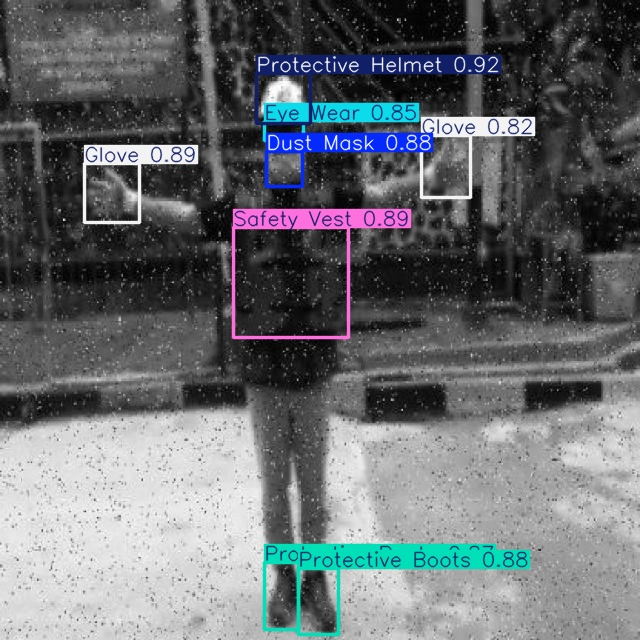

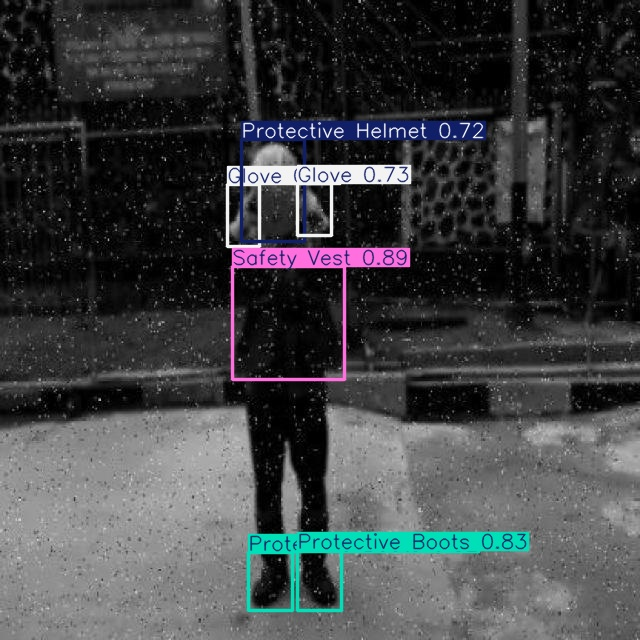

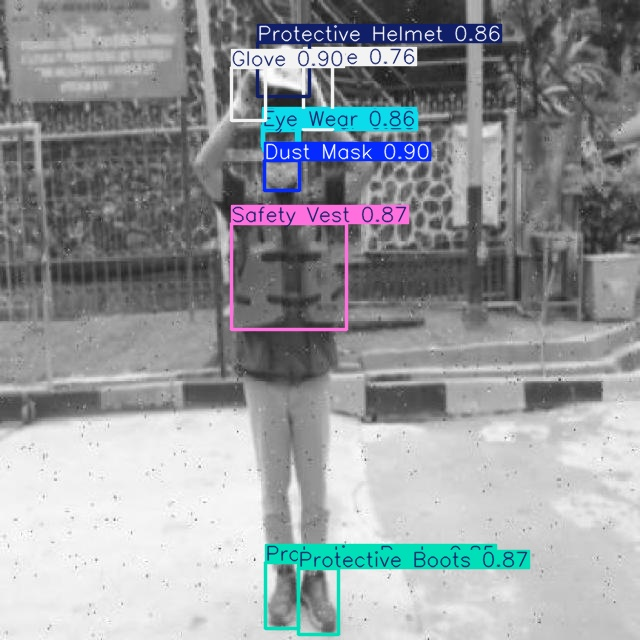

In [14]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/yolov12/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [15]:
!gdown "https://drive.google.com/uc?id=1ACZp9gmtjEdIY-SHp8K0xdR0D8Gjd3j3&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1ACZp9gmtjEdIY-SHp8K0xdR0D8Gjd3j3&confirm=t
To: /content/yolov12/image2.jpg
100% 77.7k/77.7k [00:00<00:00, 83.5MB/s]


In [20]:
!yolo task=detect mode=predict model=/content/yolov12/runs/detect/train2/weights/best.pt conf=0.25 source=/content/yolov12/image2.jpg save=True

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 352 layers, 2,558,093 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/yolov12/image2.jpg: 640x640 4 Protective Bootss, 2 Protective Helmets, 6 Safety Vests, 18.2ms
Speed: 2.8ms preprocess, 18.2ms inference, 130.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/yolov12/runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


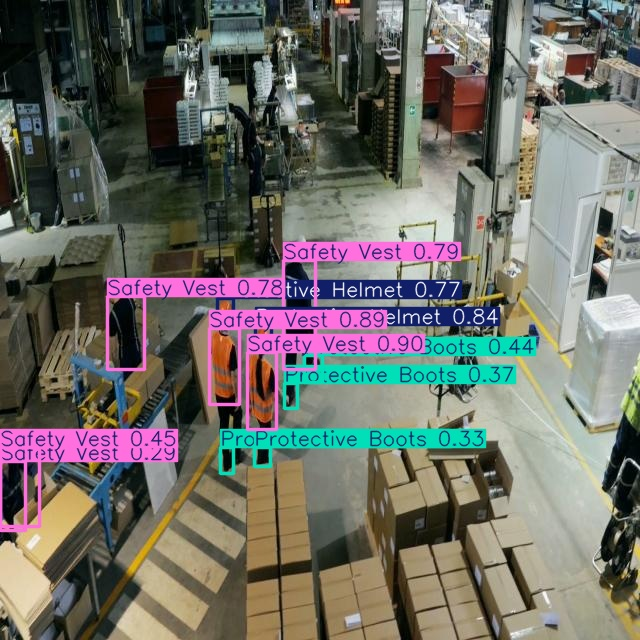

In [22]:
from IPython.display import Image

# Assuming 'predict2' is the folder containing your prediction results
image_path = "/content/yolov12/runs/detect/predict2/image2.jpg"  # Replace with actual image path inside 'predict2' folder

Image(filename=image_path, width=600)

In [23]:
!gdown "https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t
To: /content/yolov12/PPE_Part1.mp4
100% 14.2M/14.2M [00:00<00:00, 31.0MB/s]


In [24]:
!yolo task=detect mode=predict model=/content/yolov12/runs/detect/train2/weights/best.pt conf=0.25 source="/content/yolov12/PPE_Part1.mp4" save=True

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 352 layers, 2,558,093 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/310) /content/yolov12/PPE_Part1.mp4: 384x640 1 Protective Helmet, 3 Safety Vests, 57.9ms
video 1/1 (frame 2/310) /content/yolov12/PPE_Part1.mp4: 384x640 2 Protective Helmets, 2 Safety Vests, 20.0ms
video 1/1 (frame 3/310) /content/yolov12/PPE_Part1.mp4: 384x640 2 Protective Helmets, 2 Safety Vests, 16.5ms
video 1/1 (frame 4/310) /content/yolov12/PPE_Part1.mp4: 384x640 2 Protective Helmets, 2 Safety Vests, 18.0ms
video 1/1 (frame 5/310) /conten

In [32]:
!rm '/content/yolov12/result_compressed.mp4'

rm: cannot remove '/content/yolov12/result_compressed.mp4': No such file or directory


In [33]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/yolov12/runs/detect/predict3/PPE_Part1.avi'

# Compressed video path
compressed_path = "/content/yolov12/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)